# Step 1: Data Preprocessing

**3.1. Data Cleaning**

In [3]:
import pandas as pd

# Load the dataset into a Pandas DataFrame
file_path = '/content/cleaned_merged_heart_dataset.csv'
df = pd.read_csv(file_path)

# Display the first five records
print(df.head())


   age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  \
0   63    1   3       145   233    1        0      150      0        2      0   
1   37    1   2       130   250    0        1      187      0        4      0   
2   41    0   1       130   204    0        0      172      0        1      2   
3   56    1   1       120   236    0        1      178      0        1      2   
4   57    0   0       120   354    0        1      163      1        1      2   

   ca  thal  target  
0   0     1       1  
1   0     2       1  
2   0     2       1  
3   0     2       1  
4   0     2       1  


In [4]:
import pandas as pd

# Load the dataset
file_path = '/content/cleaned_merged_heart_dataset.csv'
df = pd.read_csv(file_path)

# Define continuous and categorical variables
continuous_vars = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'fbs']
categorical_vars = ['cp', 'restecg', 'slope', 'ca', 'thal','sex', 'exang']

# Create a DataFrame to store the results
results = []

# Calculate mean and median for continuous variables
for var in continuous_vars:
    mean_value = df[var].mean()
    median_value = df[var].median()
    results.append({"Variable": var, "Type": "Continuous", "Mean": mean_value, "Median": median_value, "Mode": "N/A"})

# Calculate mode for categorical variables
for var in categorical_vars:
    mode_value = df[var].mode()[0]  # The mode() method returns a Series; select the first value.
    results.append({"Variable": var, "Type": "Categorical", "Mean": "N/A", "Median": "N/A", "Mode": mode_value})

# Convert results to a DataFrame
results_df = pd.DataFrame(results)

# Display the results in tabular format
print(results_df)


    Variable         Type        Mean Median Mode
0        age   Continuous   54.354343   55.0  N/A
1   trestbps   Continuous  131.549258  130.0  N/A
2       chol   Continuous  246.855403  241.0  N/A
3    thalach   Continuous  149.424258  152.0  N/A
4    oldpeak   Continuous    1.075212    1.0  N/A
5        fbs   Continuous    0.148305    0.0  N/A
6         cp  Categorical         N/A    N/A    0
7    restecg  Categorical         N/A    N/A    0
8      slope  Categorical         N/A    N/A    1
9         ca  Categorical         N/A    N/A    0
10      thal  Categorical         N/A    N/A    2
11       sex  Categorical         N/A    N/A    1
12     exang  Categorical         N/A    N/A    0


# **Outlier Detection**

Initial Missing Values:
 age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64


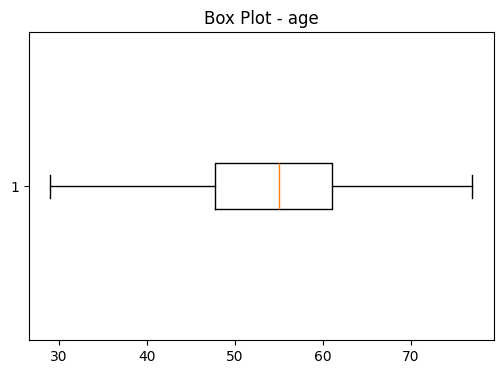

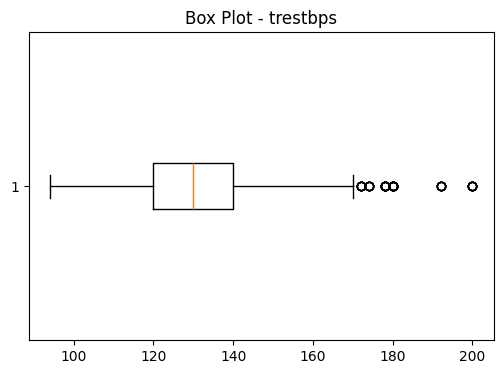

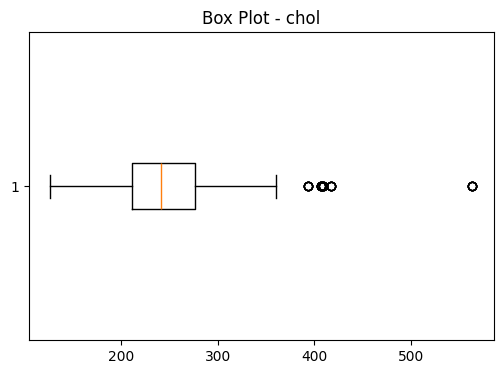

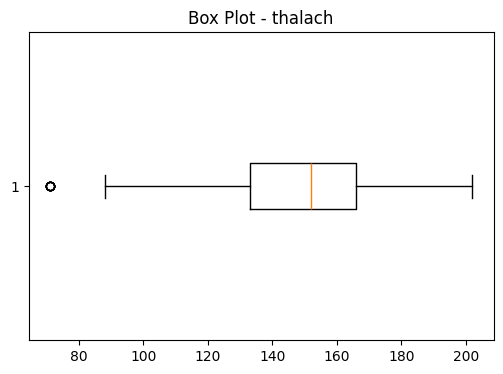

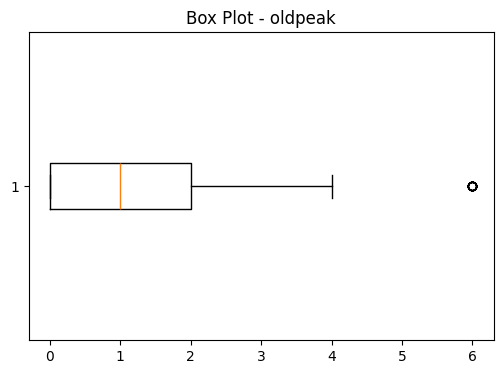

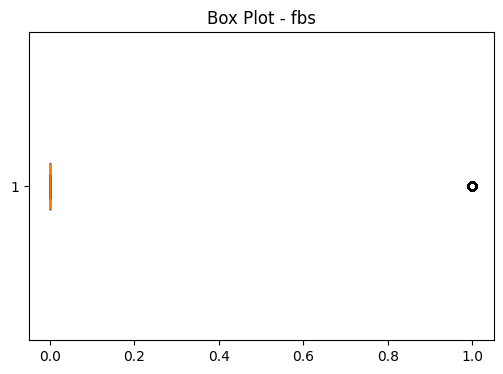

Original dataset shape: (1888, 14)
Dataset shape after outlier removal: (1830, 14)


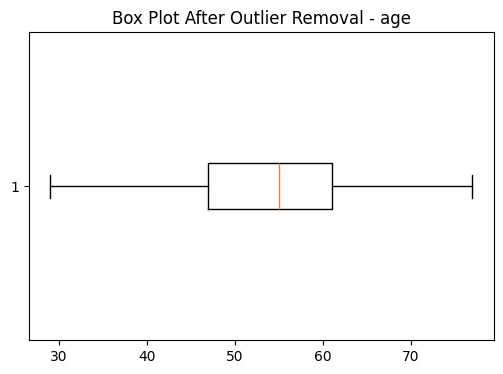

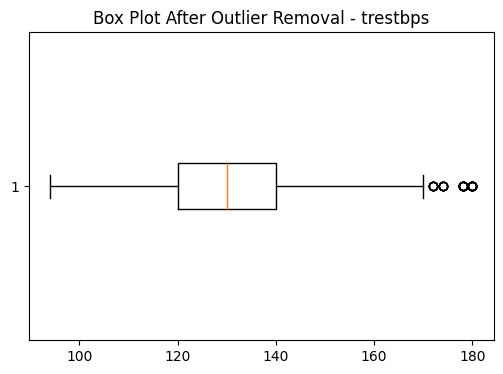

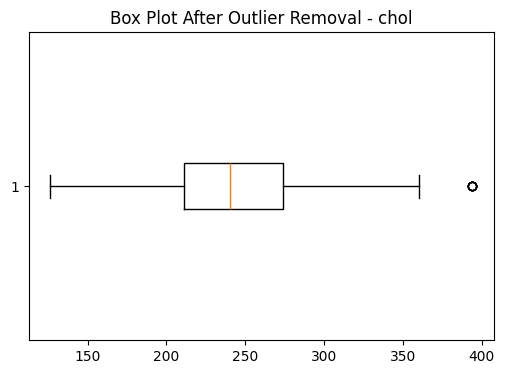

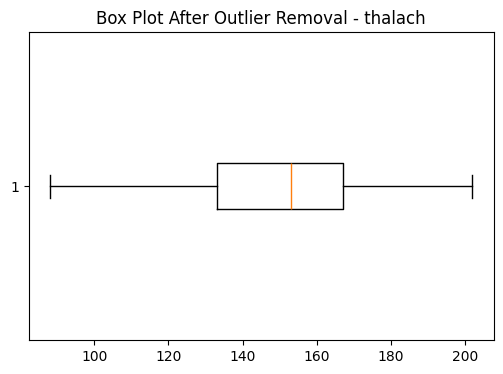

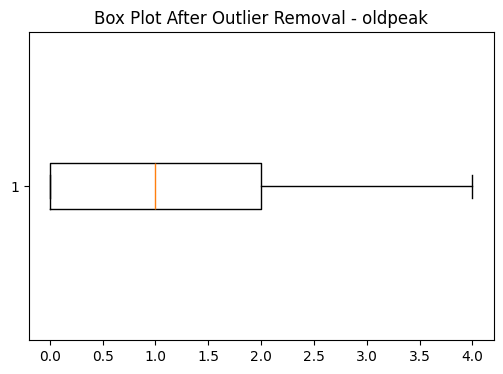

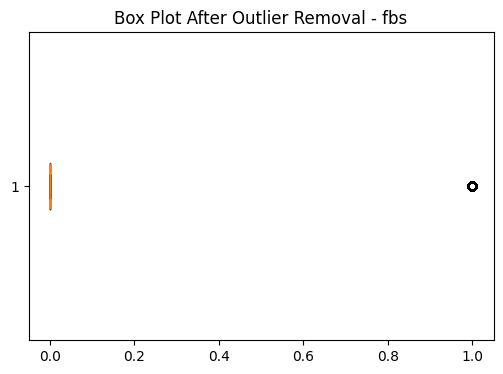

Cleaned Data without Outliers:
    age  sex  cp  trestbps  chol  fbs  restecg  thalach  exang  oldpeak  slope  \
0   63    1   3       145   233    1        0      150      0        2      0   
1   37    1   2       130   250    0        1      187      0        4      0   
2   41    0   1       130   204    0        0      172      0        1      2   
3   56    1   1       120   236    0        1      178      0        1      2   
4   57    0   0       120   354    0        1      163      1        1      2   

   ca  thal  target  
0   0     1       1  
1   0     2       1  
2   0     2       1  
3   0     2       1  
4   0     2       1  
(1830, 14)


In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import zscore

# Load the dataset
file_path = '/content/cleaned_merged_heart_dataset.csv'
df = pd.read_csv(file_path)

# Display initial summary
print("Initial Missing Values:\n", df.isnull().sum())



# Detect outliers using box plots
for var in continuous_vars:
    plt.figure(figsize=(6, 4))
    plt.boxplot(df[var], vert=False)
    plt.title(f'Box Plot - {var}')
    plt.show()

# Create a copy for removing outliers
df_wo = df.copy()

# Remove outliers using Z-scores
threshold = 3
for var in continuous_vars:
    z_scores = zscore(df[var])
    df_wo = df_wo.loc[np.abs(z_scores) <= threshold]

# Verify the shape of the new DataFrame
print(f"Original dataset shape: {df.shape}")
print(f"Dataset shape after outlier removal: {df_wo.shape}")

# Recheck for outliers using box plots post-removal
for var in continuous_vars:
    plt.figure(figsize=(6, 4))
    plt.boxplot(df_wo[var], vert=False)
    plt.title(f'Box Plot After Outlier Removal - {var}')
    plt.show()

# Display the first few rows of the cleaned DataFrame
print("Cleaned Data without Outliers:\n", df_wo.head())
df=df_wo.copy()
print(df.shape)


**Data Distribution**

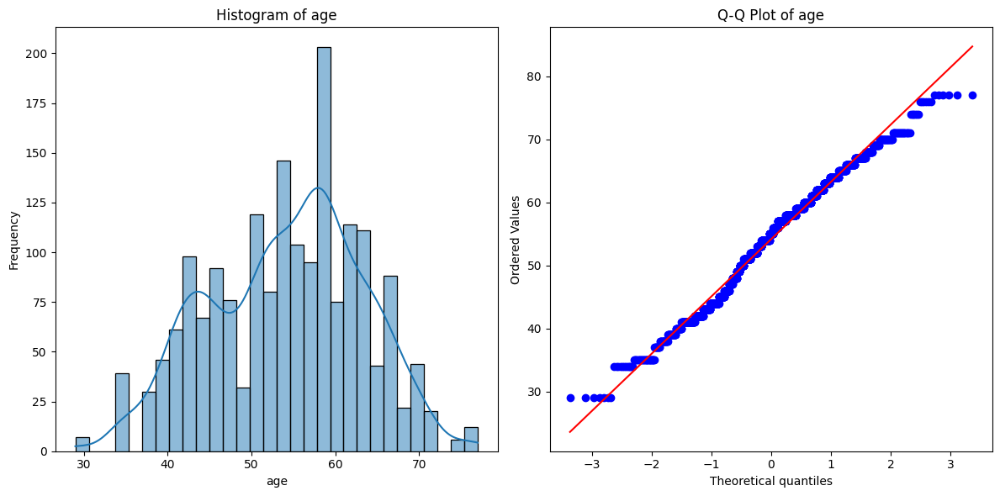

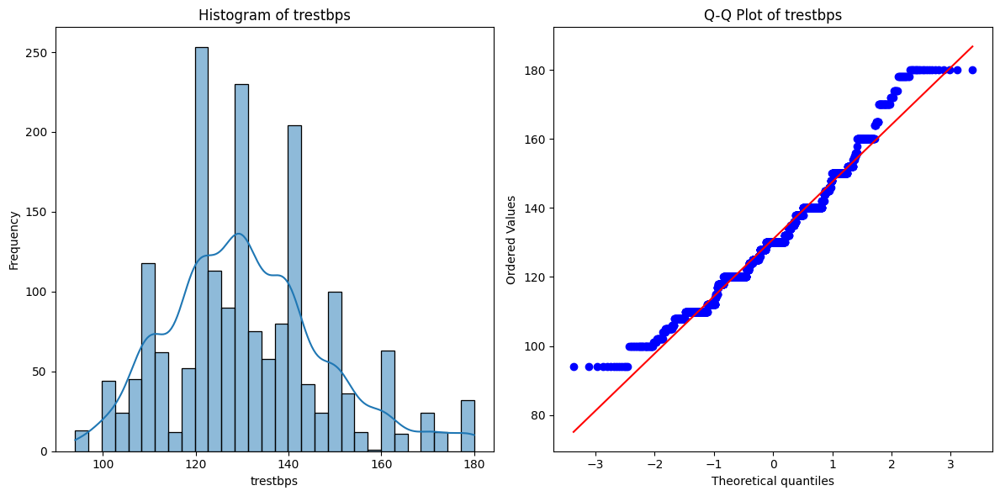

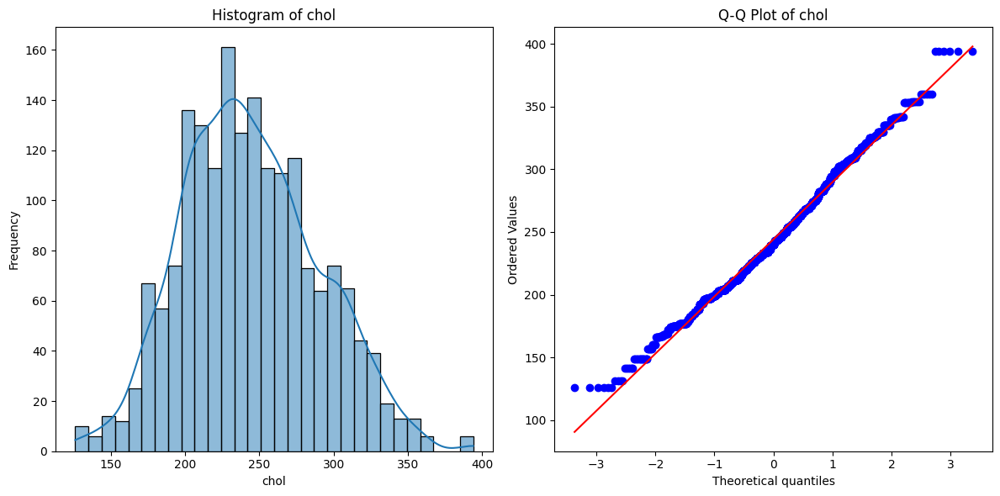

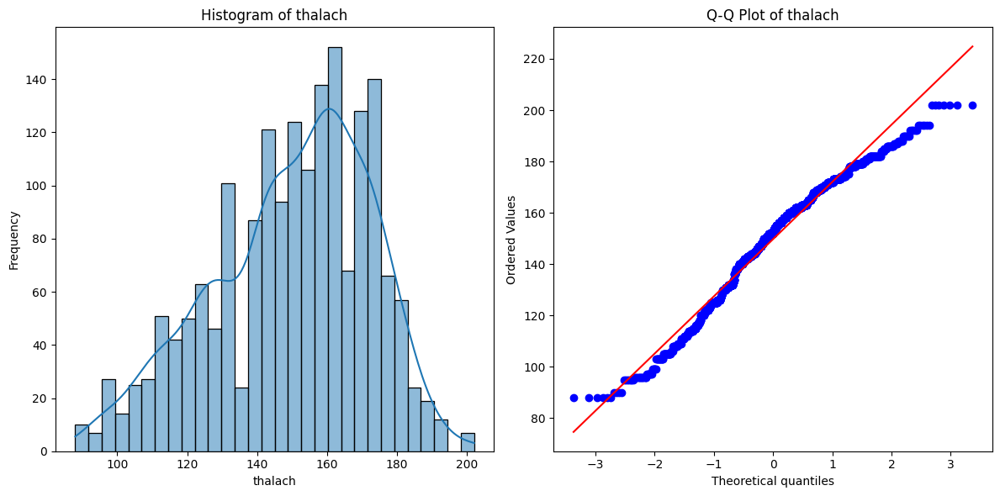

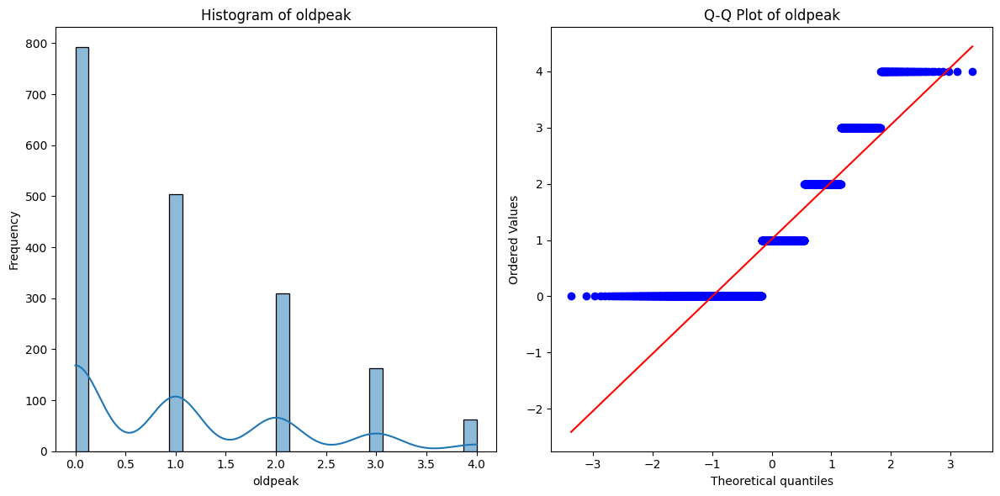

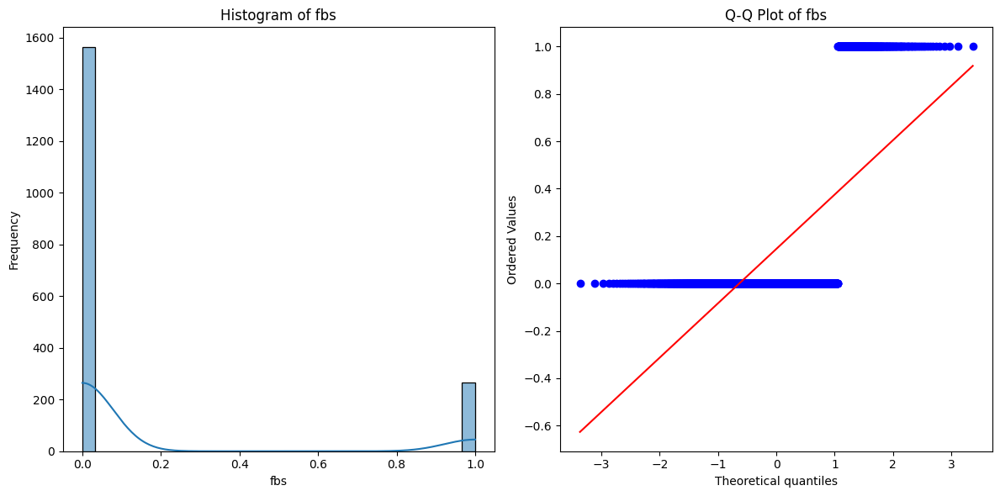

Shapiro-Wilk test for age: Statistics=0.987, p-value=0.000
age does not follow a normal distribution (reject H0)

Shapiro-Wilk test for trestbps: Statistics=0.973, p-value=0.000
trestbps does not follow a normal distribution (reject H0)

Shapiro-Wilk test for chol: Statistics=0.992, p-value=0.000
chol does not follow a normal distribution (reject H0)

Shapiro-Wilk test for thalach: Statistics=0.975, p-value=0.000
thalach does not follow a normal distribution (reject H0)

Shapiro-Wilk test for oldpeak: Statistics=0.816, p-value=0.000
oldpeak does not follow a normal distribution (reject H0)

Shapiro-Wilk test for fbs: Statistics=0.420, p-value=0.000
fbs does not follow a normal distribution (reject H0)



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats



# Function to plot histogram and Q-Q plot
def plot_gaussian_distribution(df, column):
    plt.figure(figsize=(12, 6))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    # Q-Q plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[column], dist="norm", plot=plt)
    plt.title(f'Q-Q Plot of {column}')

    plt.tight_layout()
    plt.show()

# Apply the function to each numerical column
for col in continuous_vars:
    plot_gaussian_distribution(df, col)

# Perform Shapiro-Wilk test for normality
for col in continuous_vars:
    stat, p_value = stats.shapiro(df[col])
    print(f'Shapiro-Wilk test for {col}: Statistics={stat:.3f}, p-value={p_value:.3f}')
    if p_value > 0.05:
        print(f'{col} follows a normal distribution (fail to reject H0)\n')
    else:
        print(f'{col} does not follow a normal distribution (reject H0)\n')


**3.2. Feature Scaling**

In [6]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler


# Define continuous and categorical variables
continuous_vars = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'fbs']
categorical_vars = ['cp', 'restecg', 'slope', 'ca', 'thal','sex', 'exang']

# Initialize the MinMaxScaler
scaler = MinMaxScaler()
df1 = df.copy()
# Apply the MinMaxScaler to the numerical columns
df1[continuous_vars] = scaler.fit_transform(df1[continuous_vars])

# Check the scaled dataset
df_minmax = df1.copy()
print(df_minmax.head())


        age  sex  cp  trestbps      chol  fbs  restecg   thalach  exang  \
0  0.708333    1   3  0.593023  0.399254  1.0        0  0.543860      0   
1  0.166667    1   2  0.418605  0.462687  0.0        1  0.868421      0   
2  0.250000    0   1  0.418605  0.291045  0.0        0  0.736842      0   
3  0.562500    1   1  0.302326  0.410448  0.0        1  0.789474      0   
4  0.583333    0   0  0.302326  0.850746  0.0        1  0.657895      1   

   oldpeak  slope  ca  thal  target  
0     0.50      0   0     1       1  
1     1.00      0   0     2       1  
2     0.25      2   0     2       1  
3     0.25      2   0     2       1  
4     0.25      2   0     2       1  


# 3.3.	Statistical Analysis:

**Descriptive Statistics**

In [7]:
import pandas as pd
import numpy as np

# Select only numerical columns for descriptive statistics
continuous_vars = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'fbs']

# Descriptive statistics for numeric columns
desc_stats = df_minmax[continuous_vars].describe()
print("Descriptive Statistics:\n", desc_stats)

# Calculate mean, median, mode, and standard deviation for specific numerical features
mean_values = df_minmax[continuous_vars].mean()
median_values = df_minmax[continuous_vars].median()
mode_values = df_minmax[continuous_vars].mode().iloc[0]  # Get the first mode
std_dev_values = df_minmax[continuous_vars].std()
variance_values= df_minmax[continuous_vars].var()

# Print results
print("\nMean Values:\n", mean_values)
print("\nMedian Values:\n", median_values)
print("\nMode Values:\n", mode_values)
print("\nStandard Deviation Values:\n", std_dev_values)
print("\nVariance Values:\n", variance_values)
df=df_minmax.copy()
print(df.head())

Descriptive Statistics:
                age     trestbps         chol      thalach      oldpeak  \
count  1830.000000  1830.000000  1830.000000  1830.000000  1830.000000   
mean      0.524135     0.429718     0.441273     0.541405     0.253962   
std       0.189850     0.195216     0.170782     0.197757     0.280989   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.375000     0.302326     0.317164     0.394737     0.000000   
50%       0.541667     0.418605     0.425373     0.570175     0.250000   
75%       0.666667     0.534884     0.552239     0.692982     0.500000   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

               fbs  
count  1830.000000  
mean      0.145902  
std       0.353104  
min       0.000000  
25%       0.000000  
50%       0.000000  
75%       0.000000  
max       1.000000  

Mean Values:
 age         0.524135
trestbps    0.429718
chol        0.441273
thalach     0.541405
oldpeak     0.253962

In [8]:
from scipy.stats import chi2_contingency
results = {}

for var in categorical_vars:
    contingency_table = pd.crosstab(df[var], df['target'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    results[var] = {'chi2': chi2, 'p-value': p, 'degrees_of_freedom': dof}

# Print results
for var, result in results.items():
    print(f"Variable: {var}")
    print(f"Chi2: {result['chi2']}")
    print(f"P-value: {result['p-value']}")
    print(f"Degrees of Freedom: {result['degrees_of_freedom']}\n")

    # Categorical vs. Categorical (Cross-tabulation and Chi-square test)
from scipy.stats import chi2_contingency

print("\nChi-square Test Results for Categorical Variables:")
for var1 in categorical_vars:
    for var2 in categorical_vars:
        if var1 != var2:
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2, p, dof, _ = chi2_contingency(contingency_table)
            print(f"{var1} vs. {var2}: Chi2 = {chi2:.2f}, P-value = {p:.5f}, DOF = {dof}")

Variable: cp
Chi2: 348.0516397375451
P-value: 4.620073055901699e-74
Degrees of Freedom: 4

Variable: restecg
Chi2: 61.4243968982706
P-value: 4.590517912990966e-14
Degrees of Freedom: 2

Variable: slope
Chi2: 274.16301232734946
P-value: 3.8795226538703062e-59
Degrees of Freedom: 3

Variable: ca
Chi2: 239.6072497428765
P-value: 1.127266945185394e-50
Degrees of Freedom: 4

Variable: thal
Chi2: 505.16350503816994
P-value: 6.133127307117837e-107
Degrees of Freedom: 5

Variable: sex
Chi2: 77.81778606762441
P-value: 1.1299807193217351e-18
Degrees of Freedom: 1

Variable: exang
Chi2: 184.05512777978964
P-value: 6.310656683570493e-42
Degrees of Freedom: 1


Chi-square Test Results for Categorical Variables:
cp vs. restecg: Chi2 = 539.02, P-value = 0.00000, DOF = 8
cp vs. slope: Chi2 = 162.27, P-value = 0.00000, DOF = 12
cp vs. ca: Chi2 = 181.20, P-value = 0.00000, DOF = 16
cp vs. thal: Chi2 = 917.63, P-value = 0.00000, DOF = 20
cp vs. sex: Chi2 = 26.91, P-value = 0.00002, DOF = 4
cp vs. exang: 

ANNOVA F Test

In [9]:
import pandas as pd
from sklearn.feature_selection import chi2, f_classif
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.feature_selection import SelectKBest
import matplotlib.pyplot as plt  # Import matplotlib.pyplot
import seaborn as sns  # Import seaborn
# Step 5: Perform ANOVA F-Test for numerical features
y = df['target']
x= df[continuous_vars]
f_scores, f_p_values = f_classif(x, y)

# Create a DataFrame to display the ANOVA F-Test results
anova_results = pd.DataFrame({
    'Feature': continuous_vars,
    'F_Score': f_scores,
        'p_value': f_p_values
})

print("\nANOVA F-Test Results (Numerical Features):")
print(anova_results)


ANOVA F-Test Results (Numerical Features):
    Feature     F_Score       p_value
0       age   49.442964  2.873961e-12
1  trestbps   10.378717  1.297179e-03
2      chol   14.484950  1.459369e-04
3   thalach  181.845882  1.398776e-39
4   oldpeak  184.875670  3.504222e-40
5       fbs    2.560481  1.097381e-01



Target column Distribution:
 target
1    960
0    870
Name: count, dtype: int64

 1 = more chance of Heart attack 
 0 = less chance of Heart attack



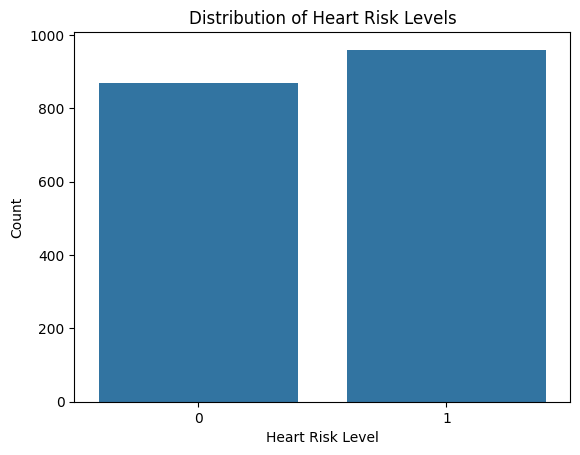

In [10]:
# Summarize 'target' distribution
tcounts = df['target'].value_counts()
print("\nTarget column Distribution:\n", tcounts)
print('\n 1 = more chance of Heart attack \n 0 = less chance of Heart attack\n')
#  distribution
sns.countplot(df, x='target')
plt.title('Distribution of Heart Risk Levels')
plt.xlabel('Heart Risk Level')
plt.ylabel('Count')
plt.show()


In [11]:
from scipy.stats import chi2_contingency
results = {}

for var in categorical_vars:
    contingency_table = pd.crosstab(df[var], df['target'])
    chi2, p, dof, expected = chi2_contingency(contingency_table)
    results[var] = {'chi2': chi2, 'p-value': p, 'degrees_of_freedom': dof}

# Print results
for var, result in results.items():
    print(f"Variable: {var}")
    print(f"Chi2: {result['chi2']}")
    print(f"P-value: {result['p-value']}")
    print(f"Degrees of Freedom: {result['degrees_of_freedom']}\n")

    # Categorical vs. Categorical (Cross-tabulation and Chi-square test)
from scipy.stats import chi2_contingency

print("\nChi-square Test Results for Categorical Variables:")
for var1 in categorical_vars:
    for var2 in categorical_vars:
        if var1 != var2:
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2, p, dof, _ = chi2_contingency(contingency_table)
            print(f"{var1} vs. {var2}: Chi2 = {chi2:.2f}, P-value = {p:.5f}, DOF = {dof}")

Variable: cp
Chi2: 348.0516397375451
P-value: 4.620073055901699e-74
Degrees of Freedom: 4

Variable: restecg
Chi2: 61.4243968982706
P-value: 4.590517912990966e-14
Degrees of Freedom: 2

Variable: slope
Chi2: 274.16301232734946
P-value: 3.8795226538703062e-59
Degrees of Freedom: 3

Variable: ca
Chi2: 239.6072497428765
P-value: 1.127266945185394e-50
Degrees of Freedom: 4

Variable: thal
Chi2: 505.16350503816994
P-value: 6.133127307117837e-107
Degrees of Freedom: 5

Variable: sex
Chi2: 77.81778606762441
P-value: 1.1299807193217351e-18
Degrees of Freedom: 1

Variable: exang
Chi2: 184.05512777978964
P-value: 6.310656683570493e-42
Degrees of Freedom: 1


Chi-square Test Results for Categorical Variables:
cp vs. restecg: Chi2 = 539.02, P-value = 0.00000, DOF = 8
cp vs. slope: Chi2 = 162.27, P-value = 0.00000, DOF = 12
cp vs. ca: Chi2 = 181.20, P-value = 0.00000, DOF = 16
cp vs. thal: Chi2 = 917.63, P-value = 0.00000, DOF = 20
cp vs. sex: Chi2 = 26.91, P-value = 0.00002, DOF = 4
cp vs. exang: 

# EDA

# **Univariate Analysis**

Continuous Variables Analysis:
               age     trestbps         chol      thalach      oldpeak  \
count  1830.000000  1830.000000  1830.000000  1830.000000  1830.000000   
mean      0.524135     0.429718     0.441273     0.541405     0.253962   
std       0.189850     0.195216     0.170782     0.197757     0.280989   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.375000     0.302326     0.317164     0.394737     0.000000   
50%       0.541667     0.418605     0.425373     0.570175     0.250000   
75%       0.666667     0.534884     0.552239     0.692982     0.500000   
max       1.000000     1.000000     1.000000     1.000000     1.000000   

               fbs  
count  1830.000000  
mean      0.145902  
std       0.353104  
min       0.000000  
25%       0.000000  
50%       0.000000  
75%       0.000000  
max       1.000000  


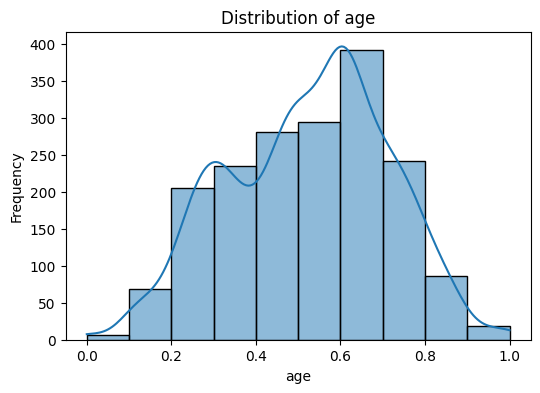

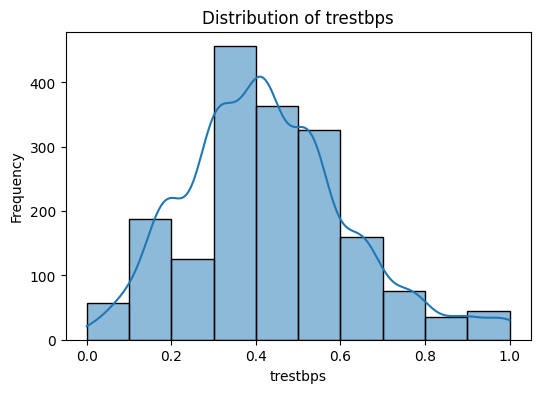

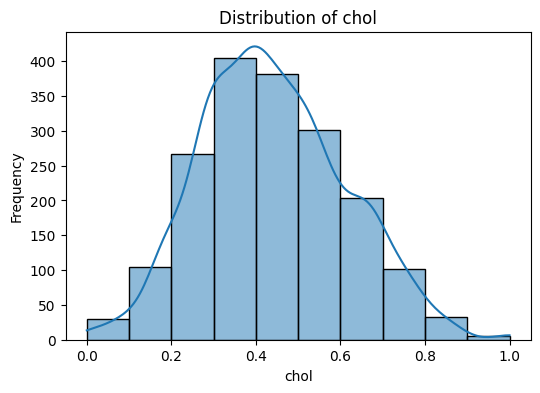

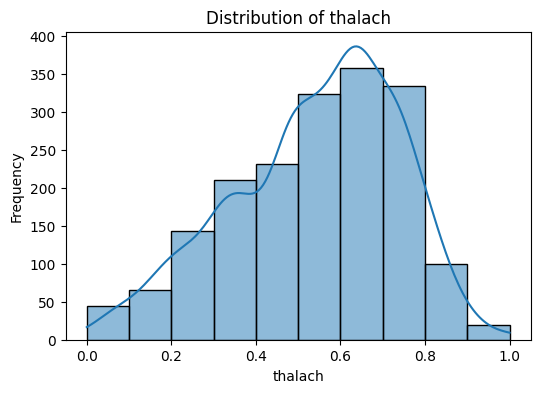

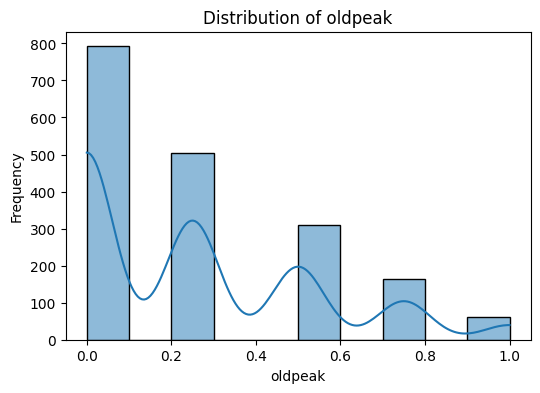

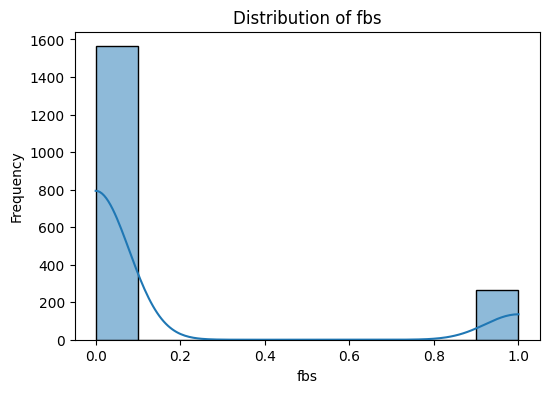

Categorical Variables Analysis:

cp Value Counts:
cp
0    732
2    488
1    286
3    200
4    124
Name: count, dtype: int64

restecg Value Counts:
restecg
0    879
1    800
2    151
Name: count, dtype: int64

slope Value Counts:
slope
2    860
1    858
0     97
3     15
Name: count, dtype: int64

ca Value Counts:
ca
0    1064
1     398
2     226
3     114
4      28
Name: count, dtype: int64

thal Value Counts:
thal
2    863
3    748
7     98
1     96
6     14
0     11
Name: count, dtype: int64

sex Value Counts:
sex
1    1279
0     551
Name: count, dtype: int64

exang Value Counts:
exang
0    1224
1     606
Name: count, dtype: int64


<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


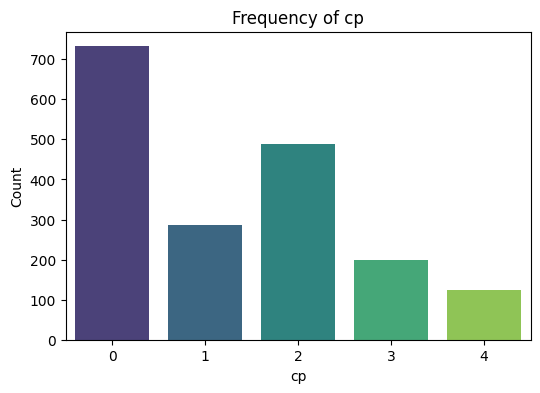

<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


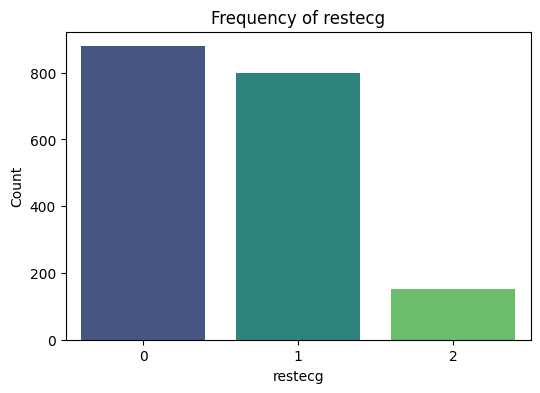

<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


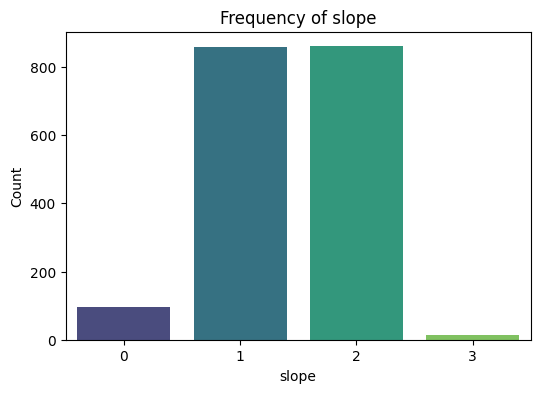

<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


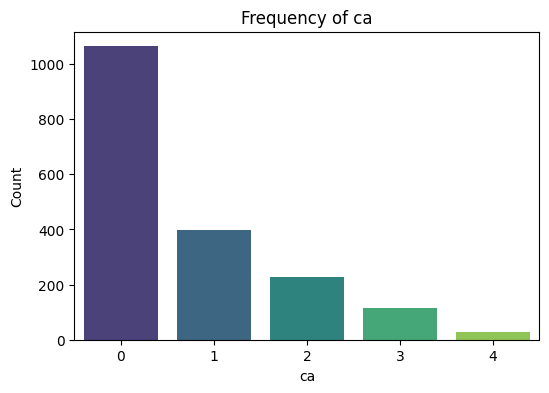

<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


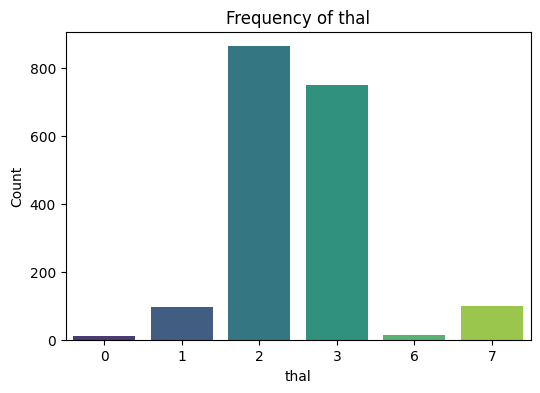

<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


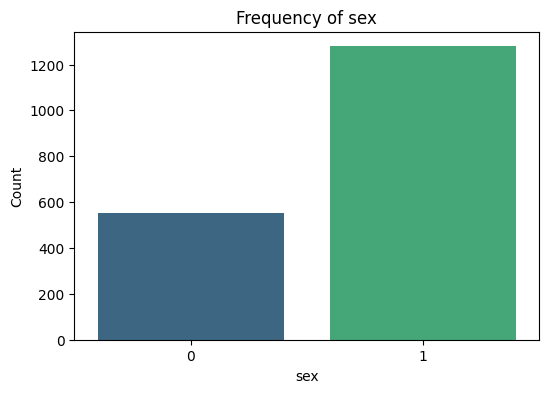

<ipython-input-12-2bcd882d5bc5>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=var, data=df, palette="viridis")


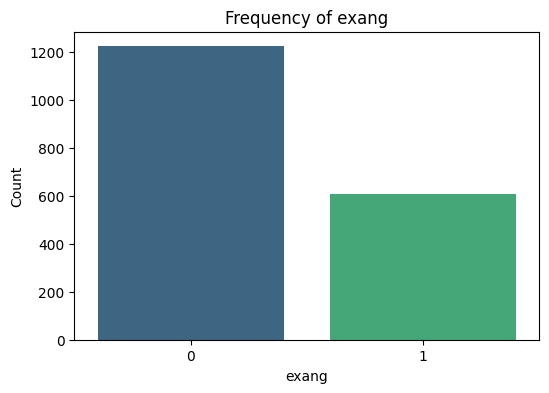

In [ ]:
# Univariate analysis for continuous variables
print("Continuous Variables Analysis:")
print(df[continuous_vars].describe())

# Visualizing distributions for continuous variables
for var in continuous_vars:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[var], kde=True, bins=10)
    plt.title(f"Distribution of {var}")
    plt.xlabel(var)
    plt.ylabel("Frequency")
    plt.show()

# Univariate analysis for categorical variables
print("Categorical Variables Analysis:")
for var in categorical_vars:
    print(f"\n{var} Value Counts:")
    print(df[var].value_counts())

# Visualizing distributions for categorical variables
for var in categorical_vars:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=var, data=df, palette="viridis")
    plt.title(f"Frequency of {var}")
    plt.xlabel(var)
    plt.ylabel("Count")
    plt.show()

# **Bivariate Analysis**

Correlation Matrix for Continuous Variables:
               age  trestbps      chol   thalach   oldpeak       fbs
age       1.000000  0.286255  0.200626 -0.395915  0.183705  0.119737
trestbps  0.286255  1.000000  0.151893 -0.062122  0.146448  0.152347
chol      0.200626  0.151893  1.000000 -0.053227  0.031092  0.008060
thalach  -0.395915 -0.062122 -0.053227  1.000000 -0.340468 -0.001532
oldpeak   0.183705  0.146448  0.031092 -0.340468  1.000000 -0.016850
fbs       0.119737  0.152347  0.008060 -0.001532 -0.016850  1.000000


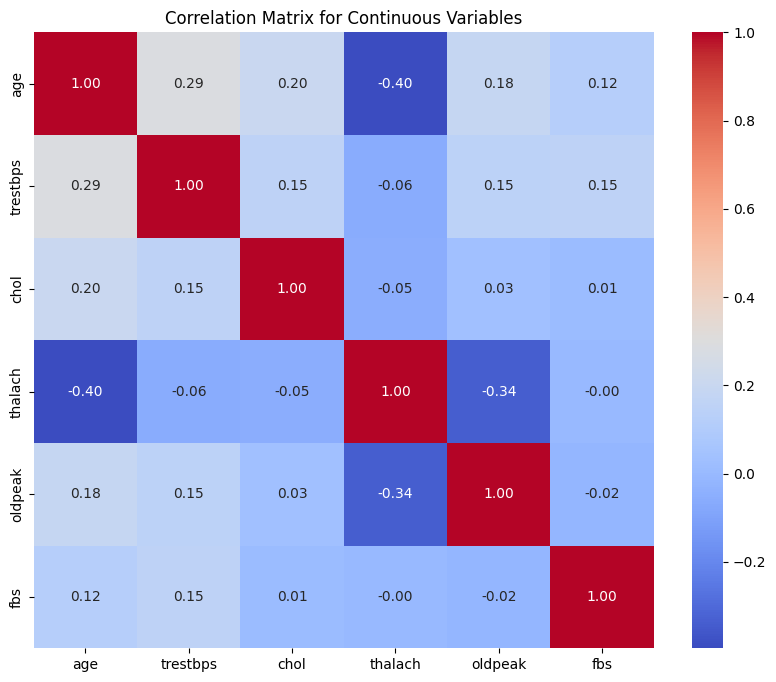

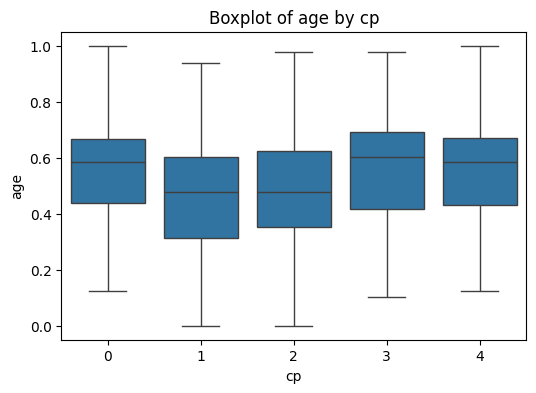

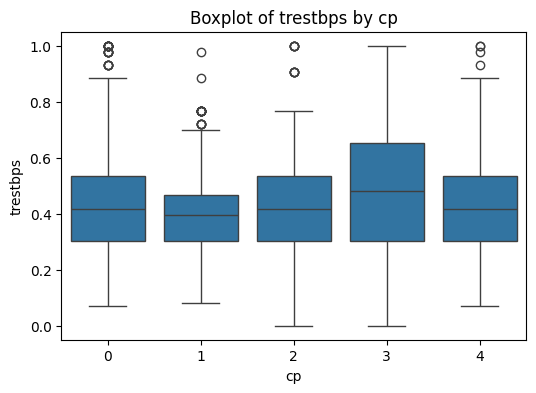

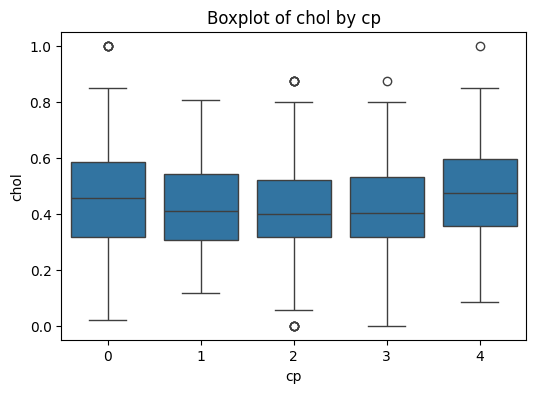

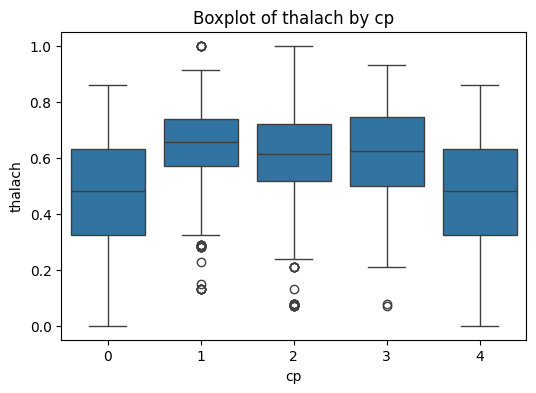

...

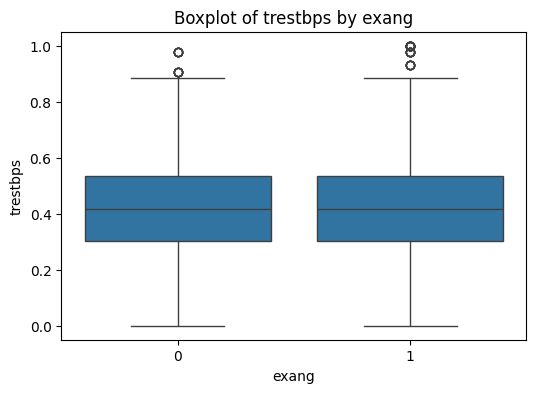

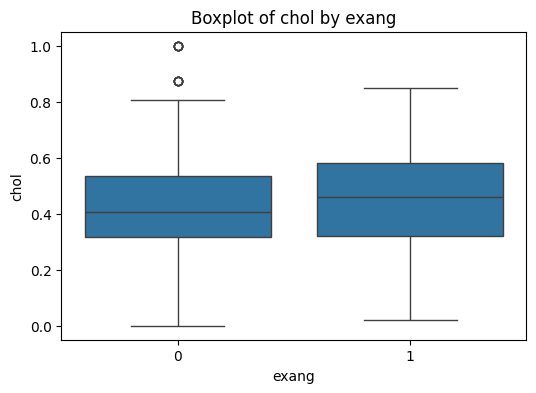

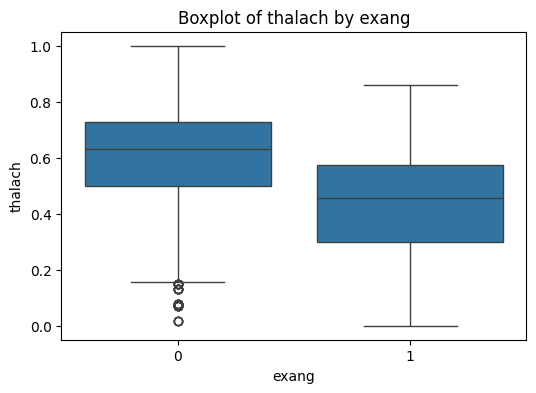

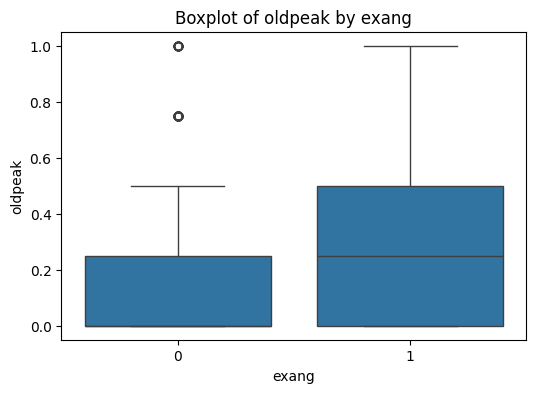

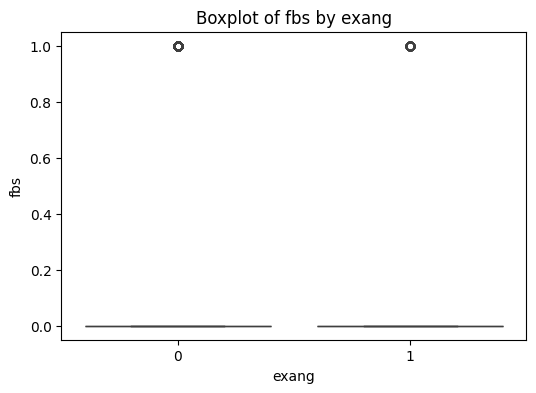


Chi-square Test Results for Categorical Variables:
cp vs. restecg: Chi2 = 539.02, P-value = 0.00000, DOF = 8
cp vs. slope: Chi2 = 162.27, P-value = 0.00000, DOF = 12
cp vs. ca: Chi2 = 181.20, P-value = 0.00000, DOF = 16
cp vs. thal: Chi2 = 917.63, P-value = 0.00000, DOF = 20
cp vs. sex: Chi2 = 26.91, P-value = 0.00002, DOF = 4
cp vs. exang: Chi2 = 393.17, P-value = 0.00000, DOF = 4
restecg vs. cp: Chi2 = 539.02, P-value = 0.00000, DOF = 8
restecg vs. slope: Chi2 = 108.68, P-value = 0.00000, DOF = 6
restecg vs. ca: Chi2 = 41.31, P-value = 0.00000, DOF = 8
restecg vs. thal: Chi2 = 351.31, P-value = 0.00000, DOF = 10
restecg vs. sex: Chi2 = 4.24, P-value = 0.12009, DOF = 2
restecg vs. exang: Chi2 = 15.11, P-value = 0.00052, DOF = 2
slope vs. cp: Chi2 = 162.27, P-value = 0.00000, DOF = 12
slope vs. restecg: Chi2 = 108.68, P-value = 0.00000, DOF = 6
slope vs. ca: Chi2 = 48.37, P-value = 0.00000, DOF = 12
slope vs. thal: Chi2 = 274.18, P-value = 0.00000, DOF = 15
slope vs. sex: Chi2 = 9.90,

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Bivariate analysis: Continuous vs. Continuous (Correlation matrix)
print("Correlation Matrix for Continuous Variables:")
correlation_matrix = df[continuous_vars].corr()
print(correlation_matrix)

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix for Continuous Variables")
plt.show()

# Continuous vs. Categorical (Boxplots)
for cat_var in categorical_vars:
    for cont_var in continuous_vars:
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=cat_var, y=cont_var, data=df)
        plt.title(f"Boxplot of {cont_var} by {cat_var}")
        plt.xlabel(cat_var)
        plt.ylabel(cont_var)
        plt.show()

# Categorical vs. Categorical (Cross-tabulation and Chi-square test)
from scipy.stats import chi2_contingency

print("\nChi-square Test Results for Categorical Variables:")
for var1 in categorical_vars:
    for var2 in categorical_vars:
        if var1 != var2:
            contingency_table = pd.crosstab(df[var1], df[var2])
            chi2, p, dof, _ = chi2_contingency(contingency_table)
            print(f"{var1} vs. {var2}: Chi2 = {chi2:.2f}, P-value = {p:.5f}, DOF = {dof}")


**Feature importance using Random Forest and Gradient Boost Classifier**

Feature Importance:

     Feature  Random Forest Importance  Gradient Boosting Importance
12      thal                  0.155682                      0.252391
2         cp                  0.130938                      0.181732
7    thalach                  0.103024                      0.042506
0        age                  0.089633                      0.060401
11        ca                  0.088045                      0.151037
4       chol                  0.086453                      0.055240
3   trestbps                  0.081248                      0.041188
10     slope                  0.076012                      0.089490
9    oldpeak                  0.053743                      0.031948
8      exang                  0.042917                      0.029128
6    restecg                  0.042245                      0.024794
1        sex                  0.035743                      0.037564
5        fbs                  0.014318                      0.002581


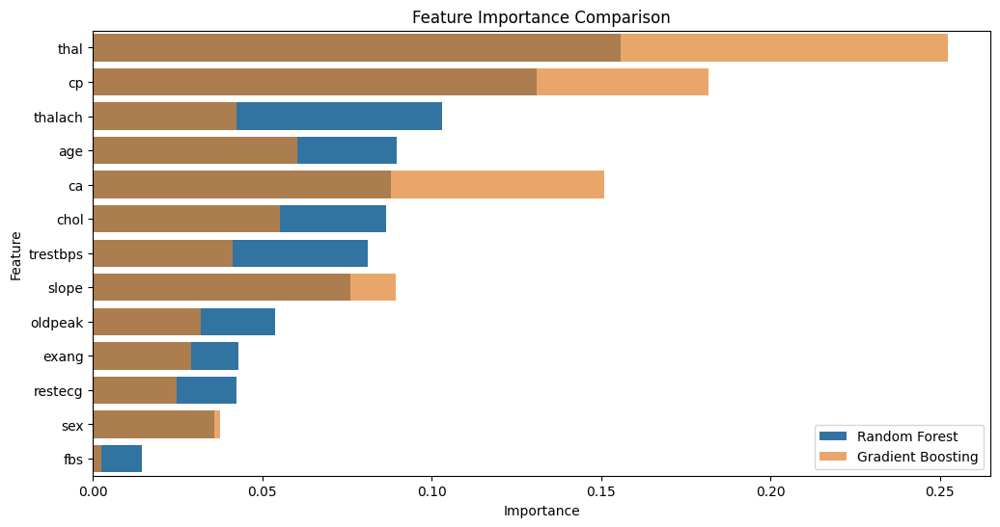

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns


# Separate features and target
X = df.drop(columns=['target'])
y = df['target']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Random Forest Classifier
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Gradient Boosting Classifier
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X_train, y_train)

# Feature importance from Random Forest
rf_importance = rf_model.feature_importances_
gb_importance = gb_model.feature_importances_

# Combine feature importance from both models
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Random Forest Importance': rf_importance,
    'Gradient Boosting Importance': gb_importance
})

# Sort by importance
feature_importance.sort_values(by='Random Forest Importance', ascending=False, inplace=True)

# Display feature importance
print("Feature Importance:\n")
print(feature_importance)

# Plot feature importance
plt.figure(figsize=(12, 6))
sns.barplot(x='Random Forest Importance', y='Feature', data=feature_importance, label="Random Forest")
sns.barplot(x='Gradient Boosting Importance', y='Feature', data=feature_importance, label="Gradient Boosting", alpha=0.7)
plt.title('Feature Importance Comparison')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.legend()
plt.show()


# Model Development

**Baseline Model: Logistic Regression**

In [ ]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import numpy as np


# Define feature set (X) and target variable (y)
X = df.drop('target', axis=1)
y = df['target']

# Ensure the target variable (y) is of integer type (0 or 1)
y = y.astype(int)

# Check for unique values in the target variable to ensure only 0s and 1s
print(f"Unique target values in y: {y.unique()}")

# 20% testing usinSplit into 80% training, g StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Further split the training data into training (80%) and validation (20%) using StratifiedShuffleSplit
sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_index, val_index in sss_val.split(X_train, y_train):
    X_train_final, X_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_final, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

# Debug: Check the unique values of the target variable in the final training set
print(f"Unique target values in y_train_final: {y_train_final.unique()}")

# Check if there are any missing values in y_train_final (should not be any)
print(f"Missing values in y_train_final: {y_train_final.isnull().sum()}")

# Compute class weights for logistic regression to handle imbalanced classes
# Convert [0, 1] into a numpy array as required by compute_class_weight
classes = np.array([0, 1])

# Compute class weights using balanced mode
try:
    class_weights = compute_class_weight('balanced', classes=classes, y=y_train_final)
    class_weight_dict = dict(zip(classes, class_weights))
    print(f"Class weights: {class_weight_dict}")
except Exception as e:
    print(f"Error in computing class weights: {e}")

# Logistic Regression model with balanced class weights
model = LogisticRegression(class_weight='balanced', random_state=42)

# Train the model on the training set
model.fit(X_train_final, y_train_final)

# Predict on the validation set
y_val_pred = model.predict(X_val)

# Evaluate the model on the validation set
lr_val_accuracy = accuracy_score(y_val, y_val_pred)
lr_val_precision = precision_score(y_val, y_val_pred)
lr_val_recall = recall_score(y_val, y_val_pred)
lr_val_f1 = f1_score(y_val, y_val_pred)
lr_val_conf_matrix = confusion_matrix(y_val, y_val_pred)

print(f"Validation Accuracy: {lr_val_accuracy:.2f}")
print(f"Validation Precision: {lr_val_precision:.2f}")
print(f"Validation Recall: {lr_val_recall:.2f}")
print(f"Validation F1 Score: {lr_val_f1:.2f}")
print(f"Validation Confusion Matrix:\n{lr_val_conf_matrix}")

# Test the model on the test set
y_test_pred = model.predict(X_test)

# Evaluate the model on the test set
lr_test_accuracy = accuracy_score(y_test, y_test_pred)
lr_test_precision = precision_score(y_test, y_test_pred)
lr_test_recall = recall_score(y_test, y_test_pred)
lr_test_f1 = f1_score(y_test, y_test_pred)
lr_test_conf_matrix = confusion_matrix(y_test, y_test_pred)

print(f"Test Accuracy: {lr_test_accuracy:.2f}")
print(f"Test Precision: {lr_test_precision:.2f}")
print(f"Test Recall: {lr_test_recall:.2f}")
print(f"Test F1 Score: {lr_test_f1:.2f}")
print(f"Test Confusion Matrix:\n{lr_test_conf_matrix}")


Unique target values in y: [1 0]
Unique target values in y_train_final: [1 0]
Missing values in y_train_final: 0
Class weights: {0: 1.0517241379310345, 1: 0.953125}
Validation Accuracy: 0.76
Validation Precision: 0.75
Validation Recall: 0.80
Validation F1 Score: 0.78
Validation Confusion Matrix:
[[123  51]
 [ 38 154]]
Test Accuracy: 0.72
Test Precision: 0.71
Test Recall: 0.77
Test F1 Score: 0.74
Test Confusion Matrix:
[[115  59]
 [ 45 147]]


# Decision tree

In [ ]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import numpy as np



# Define feature set (X) and target variable (y)
X = df.drop('target', axis=1)
y = df['target']

# Ensure the target variable (y) is of integer type (0 or 1)
y = y.astype(int)

# Check for unique values in the target variable to ensure only 0s and 1s
print(f"Unique target values in y: {y.unique()}")

# Split into 80% training, 20% testing using StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Further split the training data into training (80%) and validation (20%) using StratifiedShuffleSplit
sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_index, val_index in sss_val.split(X_train, y_train):
    X_train_final, X_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_final, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

# Debug: Check the unique values of the target variable in the final training set
print(f"Unique target values in y_train_final: {y_train_final.unique()}")

# Check if there are any missing values in y_train_final (should not be any)
print(f"Missing values in y_train_final: {y_train_final.isnull().sum()}")

# Compute class weights for decision tree to handle imbalanced classes
# Convert [0, 1] into a numpy array as required by compute_class_weight
classes = np.array([0, 1])

# Compute class weights using balanced mode
try:
    class_weights = compute_class_weight('balanced', classes=classes, y=y_train_final)
    class_weight_dict = dict(zip(classes, class_weights))
    print(f"Class weights: {class_weight_dict}")
except Exception as e:
    print(f"Error in computing class weights: {e}")

# Decision Tree Classifier model with balanced class weights
model = DecisionTreeClassifier(class_weight='balanced', random_state=42)

# Train the model on the training set
model.fit(X_train_final, y_train_final)

# Predict on the validation set
y_val_pred = model.predict(X_val)

# Evaluate the model on the validation set
d_val_accuracy = accuracy_score(y_val, y_val_pred)
d_val_precision = precision_score(y_val, y_val_pred)
d_val_recall = recall_score(y_val, y_val_pred)
d_val_f1 = f1_score(y_val, y_val_pred)
d_val_conf_matrix = confusion_matrix(y_val, y_val_pred)

print(f"Validation Accuracy: {d_val_accuracy:.4f}")
print(f"Validation Precision: {d_val_precision:.4f}")
print(f"Validation Recall: {d_val_recall:.4f}")
print(f"Validation F1 Score: {d_val_f1:.4f}")
print(f"Validation Confusion Matrix:\n{d_val_conf_matrix}")

# Test the model on the test set
y_test_pred = model.predict(X_test)

# Evaluate the model on the test set
d_test_accuracy = accuracy_score(y_test, y_test_pred)
d_test_precision = precision_score(y_test, y_test_pred)
d_test_recall = recall_score(y_test, y_test_pred)
d_test_f1 = f1_score(y_test, y_test_pred)
d_test_conf_matrix = confusion_matrix(y_test, y_test_pred)

print(f"Test Accuracy: {d_test_accuracy:.4f}")
print(f"Test Precision: {d_test_precision:.4f}")
print(f"Test Recall: {d_test_recall:.4f}")
print(f"Test F1 Score: {d_test_f1:.4f}")
print(f"Test Confusion Matrix:\n{d_test_conf_matrix}")


Unique target values in y: [1 0]
Unique target values in y_train_final: [1 0]
Missing values in y_train_final: 0
Class weights: {0: 1.0517241379310345, 1: 0.953125}
Validation Accuracy: 0.9481
Validation Precision: 0.9436
Validation Recall: 0.9583
Validation F1 Score: 0.9509
Validation Confusion Matrix:
[[163  11]
 [  8 184]]
Test Accuracy: 0.9617
Test Precision: 0.9588
Test Recall: 0.9688
Test F1 Score: 0.9637
Test Confusion Matrix:
[[166   8]
 [  6 186]]


# SVM

In [ ]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
import numpy as np


# Define feature set (X) and target variable (y)
X = df.drop('target', axis=1)
y = df['target']

# Ensure the target variable (y) is of integer type (0 or 1)
y = y.astype(int)

# Check for unique values in the target variable to ensure only 0s and 1s
print(f"Unique target values in y: {y.unique()}")

# Split into 80% training, 20% testing using StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Further split the training data into training (80%) and validation (20%) using StratifiedShuffleSplit
sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_index, val_index in sss_val.split(X_train, y_train):
    X_train_final, X_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_final, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

# Debug: Check the unique values of the target variable in the final training set
print(f"Unique target values in y_train_final: {y_train_final.unique()}")

# Check if there are any missing values in y_train_final (should not be any)
print(f"Missing values in y_train_final: {y_train_final.isnull().sum()}")

# Compute class weights for SVM to handle imbalanced classes
# Convert [0, 1] into a numpy array as required by compute_class_weight
classes = np.array([0, 1])

# Compute class weights using balanced mode
try:
    class_weights = compute_class_weight('balanced', classes=classes, y=y_train_final)
    class_weight_dict = dict(zip(classes, class_weights))
    print(f"Class weights: {class_weight_dict}")
except Exception as e:
    print(f"Error in computing class weights: {e}")

# Support Vector Machine model with balanced class weights
model = SVC(class_weight='balanced', random_state=42)

# Train the model on the training set
model.fit(X_train_final, y_train_final)

# Predict on the validation set
y_val_pred = model.predict(X_val)

# Evaluate the model on the validation set
s_val_accuracy = accuracy_score(y_val, y_val_pred)
s_val_precision = precision_score(y_val, y_val_pred)
s_val_recall = recall_score(y_val, y_val_pred)
s_val_f1 = f1_score(y_val, y_val_pred)
s_val_conf_matrix = confusion_matrix(y_val, y_val_pred)

print(f"Validation Accuracy: {s_val_accuracy:.4f}")
print(f"Validation Precision: {s_val_precision:.4f}")
print(f"Validation Recall: {s_val_recall:.4f}")
print(f"Validation F1 Score: {s_val_f1:.4f}")
print(f"Validation Confusion Matrix:\n{s_val_conf_matrix}")

# Test the model on the test set
y_test_pred = model.predict(X_test)

# Evaluate the model on the test set
s_test_accuracy = accuracy_score(y_test, y_test_pred)
s_test_precision = precision_score(y_test, y_test_pred)
s_test_recall = recall_score(y_test, y_test_pred)
s_test_f1 = f1_score(y_test, y_test_pred)
s_test_conf_matrix = confusion_matrix(y_test, y_test_pred)

print(f"Test Accuracy: {s_test_accuracy:.4f}")
print(f"Test Precision: {s_test_precision:.4f}")
print(f"Test Recall: {s_test_recall:.4f}")
print(f"Test F1 Score: {s_test_f1:.4f}")
print(f"Test Confusion Matrix:\n{s_test_conf_matrix}")


Unique target values in y: [1 0]
Unique target values in y_train_final: [1 0]
Missing values in y_train_final: 0
Class weights: {0: 1.0517241379310345, 1: 0.953125}
Validation Accuracy: 0.8197
Validation Precision: 0.8316
Validation Recall: 0.8229
Validation F1 Score: 0.8272
Validation Confusion Matrix:
[[142  32]
 [ 34 158]]
Test Accuracy: 0.8443
Test Precision: 0.8689
Test Recall: 0.8281
Test F1 Score: 0.8480
Test Confusion Matrix:
[[150  24]
 [ 33 159]]


# neural network

In [ ]:
pip install imbalanced-learn

In [ ]:
import pandas as pd
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE
import numpy as np


# Define feature set (X) and target variable (y)
X = df.drop('target', axis=1)
y = df['target']

# Ensure the target variable (y) is of integer type (0 or 1)
y = y.astype(int)

# Split into 80% training, 20% testing using StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

# Further split the training data into training (80%) and validation (20%) using StratifiedShuffleSplit
sss_val = StratifiedShuffleSplit(n_splits=1, test_size=0.25, random_state=42)
for train_index, val_index in sss_val.split(X_train, y_train):
    X_train_final, X_val = X_train.iloc[train_index], X_train.iloc[val_index]
    y_train_final, y_val = y_train.iloc[train_index], y_train.iloc[val_index]

# Debug: Check the unique values of the target variable in the final training set
print(f"Unique target values in y_train_final: {y_train_final.unique()}")

# Check if there are any missing values in y_train_final (should not be any)
print(f"Missing values in y_train_final: {y_train_final.isnull().sum()}")

# Apply SMOTE to balance the dataset (oversampling the minority class)
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_final_smote, y_train_final_smote = smote.fit_resample(X_train_final, y_train_final)

print(f"Original training set size: {X_train_final.shape}")
print(f"Resampled training set size: {X_train_final_smote.shape}")

# Neural Network (MLP) model with backpropagation
model = MLPClassifier(hidden_layer_sizes=(50, 30), max_iter=1000, random_state=42,
                      solver='adam', activation='relu')

# Train the model on the balanced (SMOTE) training set
model.fit(X_train_final_smote, y_train_final_smote)

# Predict on the validation set
y_val_pred = model.predict(X_val)

# Evaluate the model on the validation set
n_val_accuracy = accuracy_score(y_val, y_val_pred)
n_val_precision = precision_score(y_val, y_val_pred)
n_val_recall = recall_score(y_val, y_val_pred)
n_val_f1 = f1_score(y_val, y_val_pred)
n_val_conf_matrix = confusion_matrix(y_val, y_val_pred)

print(f"Validation Accuracy: {n_val_accuracy:.4f}")
print(f"Validation Precision: {n_val_precision:.4f}")
print(f"Validation Recall: {n_val_recall:.4f}")
print(f"Validation F1 Score: {n_val_f1:.4f}")
print(f"Validation Confusion Matrix:\n{n_val_conf_matrix}")

# Test the model on the test set
y_test_pred = model.predict(X_test)

# Evaluate the model on the test set
n_test_accuracy = accuracy_score(y_test, y_test_pred)
n_test_precision = precision_score(y_test, y_test_pred)
n_test_recall = recall_score(y_test, y_test_pred)
n_test_f1 = f1_score(y_test, y_test_pred)
n_test_conf_matrix = confusion_matrix(y_test, y_test_pred)

print(f"Test Accuracy: {n_test_accuracy:.4f}")
print(f"Test Precision: {n_test_precision:.4f}")
print(f"Test Recall: {n_test_recall:.4f}")
print(f"Test F1 Score: {n_test_f1:.4f}")
print(f"Test Confusion Matrix:\n{n_test_conf_matrix}")


Unique target values in y_train_final: [1 0]
Missing values in y_train_final: 0
Original training set size: (1098, 13)
Resampled training set size: (1152, 13)
Validation Accuracy: 0.9536
Validation Precision: 0.9397
Validation Recall: 0.9740
Validation F1 Score: 0.9565
Validation Confusion Matrix:
[[162  12]
 [  5 187]]
Test Accuracy: 0.9481
Test Precision: 0.9303
Test Recall: 0.9740
Test F1 Score: 0.9517
Test Confusion Matrix:
[[160  14]
 [  5 187]]


# LIME

In [ ]:
pip install lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=07f3f9ccbc7b82b7554bf35b55f4de0007049d2c76b04df56eaeb3b4300ac38a
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import numpy as np
import pandas as pd
from lime.lime_tabular import LimeTabularExplainer
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE

# Assuming the MLPClassifier model has already been trained on a balanced dataset
# and the dataset is loaded as X, y

# Step 1: Reuse X_train_final, X_test, and the trained model
# SMOTE has already been applied earlier (refer to previous code).

# Train the neural network again (if not already trained)
model = MLPClassifier(hidden_layer_sizes=(50, 30), max_iter=1000, random_state=42,
                      solver='adam', activation='relu')
model.fit(X_train_final_smote, y_train_final_smote)

# Step 2: Apply LIME to interpret predictions

# Initialize LIME Tabular Explainer
explainer = LimeTabularExplainer(
    training_data=X_train_final_smote.values,  # SMOTE balanced training data
    feature_names=X.columns,                  # Feature names
    class_names=['Low Risk', 'High Risk'],    # Class names (adjust as per your target variable)
    discretize_continuous=True,               # Discretize continuous features for better explanations
    mode='classification'                     # Classification problem
)

# Step 3: Explain a prediction
# Pick a test sample (e.g., the first instance from the test set)
sample_index = 0
test_sample = X_test.iloc[sample_index].values.reshape(1, -1)

# Get the prediction for the selected sample
predicted_class = model.predict(test_sample)[0]
print(f"Predicted Class: {predicted_class}")

# Explain the prediction for the selected test sample
explanation = explainer.explain_instance(
    data_row=X_test.iloc[sample_index].values,  # Test sample (single instance)
    predict_fn=model.predict_proba              # Function to predict probabilities
)

# Step 4: Display the explanation
# Visualize the explanation in the notebook or save as HTML
explanation.show_in_notebook(show_table=True)
# explanation.save_to_file('lime_explanation.html')


Predicted Class: 1


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


In [ ]:
import numpy as np
import pandas as pd
from lime.lime_tabular import LimeTabularExplainer
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.over_sampling import SMOTE

# Assuming the MLPClassifier model is already trained and data is preprocessed
# and balanced using SMOTE (refer to previous examples).

# Initialize LIME Explainer
explainer = LimeTabularExplainer(
    training_data=X_train_final_smote.values,  # Balanced training data
    feature_names=X.columns,                  # Feature names
    class_names=['Low Risk', 'High Risk'],    # Class names
    discretize_continuous=True,               # Discretize continuous features
    mode='classification'                     # Mode of explanation
)

# Generate explanations for multiple test samples
num_samples_to_explain = 5  # Number of test samples to explain
samples_indices = np.random.choice(X_test.index, num_samples_to_explain, replace=False)  # Randomly select indices

for sample_index in samples_indices:
    # Get the test sample and its true label
    test_sample = X_test.loc[sample_index].values.reshape(1, -1)
    true_label = y_test.loc[sample_index]

    # Get the model's predicted class and probabilities
    predicted_class = model.predict(test_sample)[0]
    predicted_probabilities = model.predict_proba(test_sample)

    print(f"\nTest Sample Index: {sample_index}")
    print(f"True Label: {true_label}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Predicted Probabilities: {predicted_probabilities}")

    # Explain the prediction for the current test sample
    explanation = explainer.explain_instance(
        data_row=X_test.loc[sample_index].values,  # Single test instance
        predict_fn=model.predict_proba,           # Predict probabilities function
        num_features=10                           # Top 10 features to show
    )

    # Show the explanation in the notebook
    explanation.show_in_notebook(show_table=True)

    # Optionally save the explanation to an HTML file
    explanation.save_to_file(f'lime_explanation_sample_{sample_index}.html')


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(



Test Sample Index: 302
True Label: 0
Predicted Class: 0
Predicted Probabilities: [[0.97853975 0.02146025]]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(



Test Sample Index: 679
True Label: 1
Predicted Class: 1
Predicted Probabilities: [[3.13171711e-12 1.00000000e+00]]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(



Test Sample Index: 42
True Label: 1
Predicted Class: 1
Predicted Probabilities: [[0.01036912 0.98963088]]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(



Test Sample Index: 993
True Label: 1
Predicted Class: 1
Predicted Probabilities: [[0.15287776 0.84712224]]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(



Test Sample Index: 1117
True Label: 1
Predicted Class: 1
Predicted Probabilities: [[1.95626119e-07 9.99999804e-01]]


# Accuracy comparision

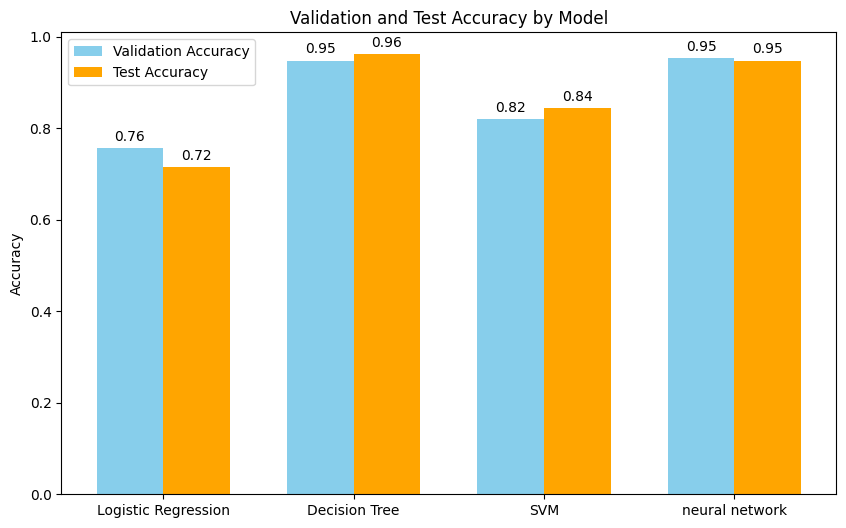

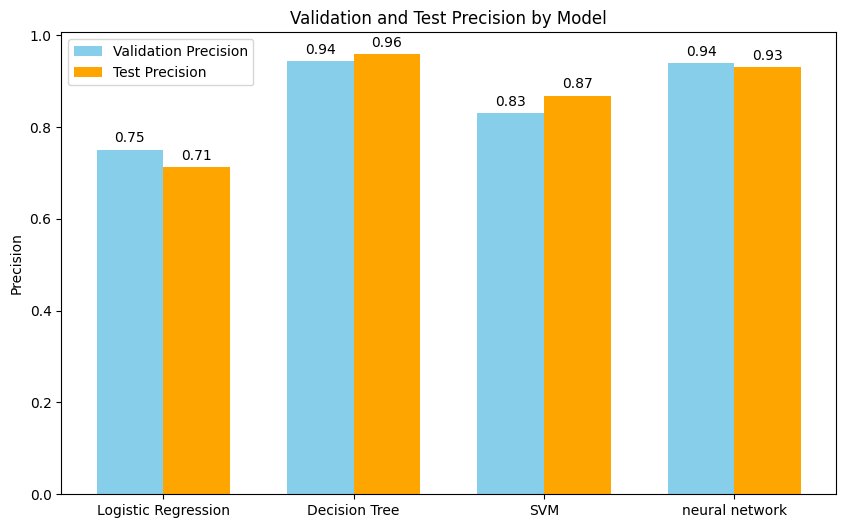

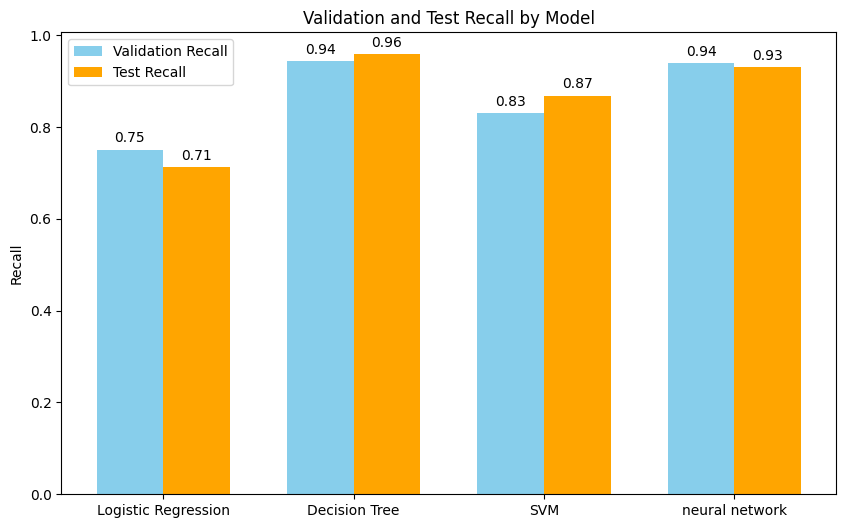

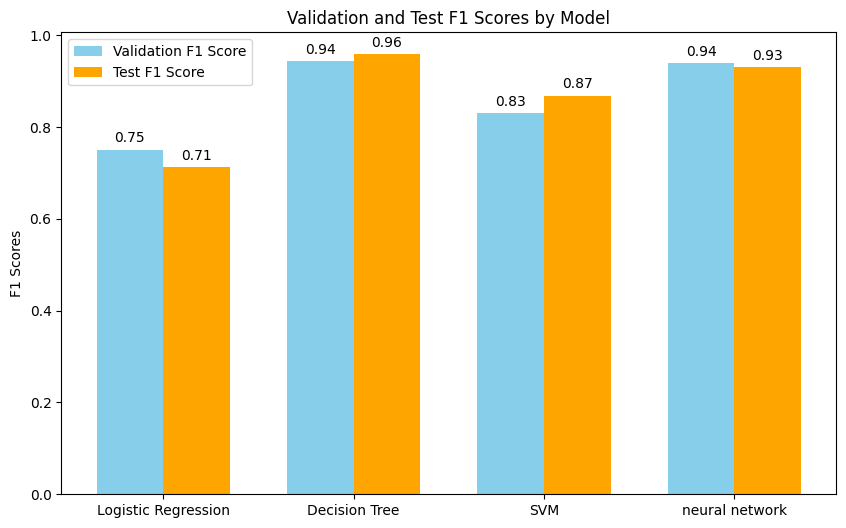

In [ ]:
# Metrics for the three models
models = ['Logistic Regression', 'Decision Tree', 'SVM', 'neural network']
val_accuracies = [lr_val_accuracy, d_val_accuracy, s_val_accuracy,n_val_accuracy]
test_accuracies = [lr_test_accuracy,d_test_accuracy,s_test_accuracy,n_test_accuracy]

test_precisions = [lr_test_precision, d_test_precision, s_test_precision,n_test_precision]
val_precisions = [lr_val_precision, d_val_precision,s_val_precision,n_val_precision]

test_recalls = [lr_test_recall,d_test_recall,s_test_recall,n_test_recall]
val_recalls = [lr_val_recall,d_val_recall,s_val_recall,n_val_recall]

test_f1_scores = [lr_test_f1,d_test_f1,s_test_f1,n_test_f1]
val_f1_scores = [lr_val_f1,d_val_f1,s_val_f1,n_val_f1]



# Plot for accuracies
x = np.arange(len(models))  # X-axis locations
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, val_accuracies, width, label='Validation Accuracy', color='skyblue')
rects2 = ax.bar(x + width/2, test_accuracies, width, label='Test Accuracy', color='orange')

# Add labels and title
ax.set_ylabel('Accuracy')
ax.set_title('Validation and Test Accuracy by Model')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Add data labels
def add_labels(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

add_labels(rects1)
add_labels(rects2)

plt.show()

# Plot for precision
x = np.arange(len(models))  # X-axis locations
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, val_precisions, width, label='Validation Precision', color='skyblue')
rects2 = ax.bar(x + width/2, test_precisions, width, label='Test Precision', color='orange')

# Add labels and title
ax.set_ylabel('Precision')
ax.set_title('Validation and Test Precision by Model')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Add data labels
def add_labels(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

add_labels(rects1)
add_labels(rects2)

plt.show()

# Plot for Recall
x = np.arange(len(models))  # X-axis locations
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, val_precisions, width, label='Validation Recall', color='skyblue')
rects2 = ax.bar(x + width/2, test_precisions, width, label='Test Recall', color='orange')

# Add labels and title
ax.set_ylabel('Recall')
ax.set_title('Validation and Test Recall by Model')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Add data labels
def add_labels(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

add_labels(rects1)
add_labels(rects2)

plt.show()
# Plot for F1
x = np.arange(len(models))  # X-axis locations
width = 0.35  # Width of the bars

fig, ax = plt.subplots(figsize=(10, 6))
rects1 = ax.bar(x - width/2, val_precisions, width, label='Validation F1 Score', color='skyblue')
rects2 = ax.bar(x + width/2, test_precisions, width, label='Test F1 Score', color='orange')

# Add labels and title
ax.set_ylabel('F1 Scores')
ax.set_title('Validation and Test F1 Scores by Model')
ax.set_xticks(x)
ax.set_xticklabels(models)
ax.legend()

# Add data labels
def add_labels(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}', xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3), textcoords="offset points", ha='center', va='bottom')

add_labels(rects1)
add_labels(rects2)

plt.show()
